# **Project: House Prices - Linear Regression Techniques**

### **Reference**: [Kaggle](https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques)

--- 
### **1. Look the big picture**

- **Objective**: Predict house prices by building a robust linear regression model.
- **Goal**: Minimize the Root-Mean-Squared-Error (RMSE) to improve prediction accuracy.
- **Dataset**: 
  - The dataset contains various features about houses (e.g., square footage, number of rooms, etc.) and their sale prices.
  - Provided by the Kaggle competition: *"House Prices - Advanced Regression Techniques."*
- **Evaluation Metric**: Root-Mean-Squared-Error (RMSE).
  

---
### **2. Get the data**

In [1]:
import pandas as pd
df = pd.read_csv("../data/house_price_project/train.csv")
df_test = pd.read_csv("../data/house_price_project/test.csv")

In [2]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
df.shape

(1460, 81)

---
### **3. Explore and visualize the data to gain insights.**

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats

#### Find null values

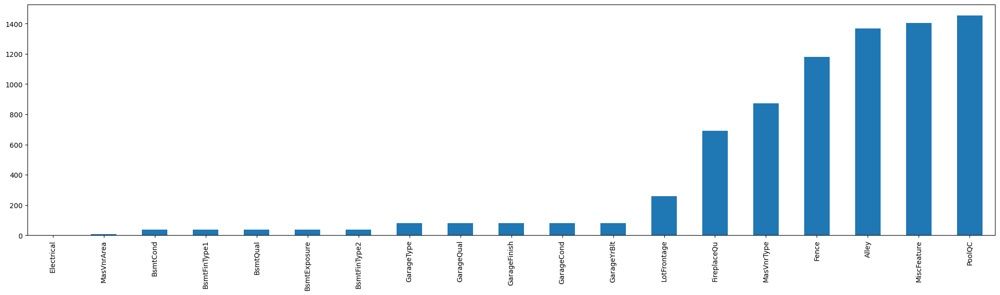

In [5]:
missing = df.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot(kind='bar', figsize=(25, 6));


#### Fix null values in "object" types

In [6]:
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        df[col] = df[col].fillna("MISSING")

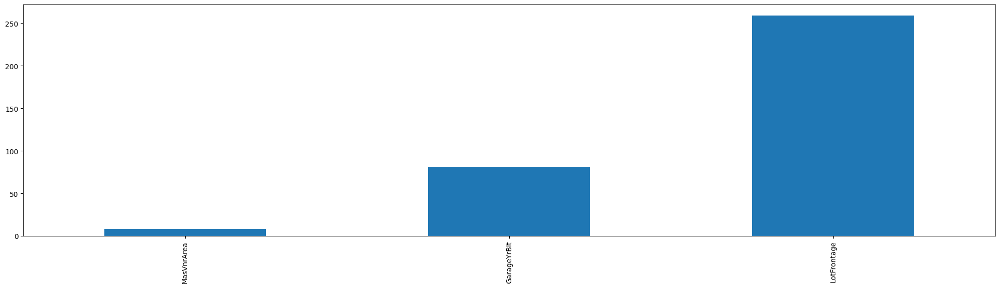

In [7]:
missing = df.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot(kind='bar', figsize=(25, 6));

In [8]:
df["MasVnrArea"].describe()
df["MasVnrArea"].fillna(0, inplace=True)

C:\Users\david\AppData\Local\Temp\ipykernel_25344\101664663.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["MasVnrArea"].fillna(0, inplace=True)


In [9]:
df["LotFrontage"].describe()
df["LotFrontage"].fillna(df["LotFrontage"].min(), inplace=True)

C:\Users\david\AppData\Local\Temp\ipykernel_25344\1414674940.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["LotFrontage"].fillna(df["LotFrontage"].min(), inplace=True)


#### General info

In [10]:
# Quantitative features
quantitative = df.select_dtypes(exclude='object').columns.tolist()
quantitative = quantitative[1:] # exclude Id
quantitative = quantitative[:-1] # exclude SalePrice

# Qualitative features  
qualitative = df.select_dtypes(include='object').columns.tolist()

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          1460 non-null   object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [12]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1460.0,61.348630,28.920320,21.0,42.00,63.0,79.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1460.0,103.117123,180.731373,0.0,0.00,0.0,164.25,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


#### Understanding the columns
Histograms for numerical data and bar plot for categorical data

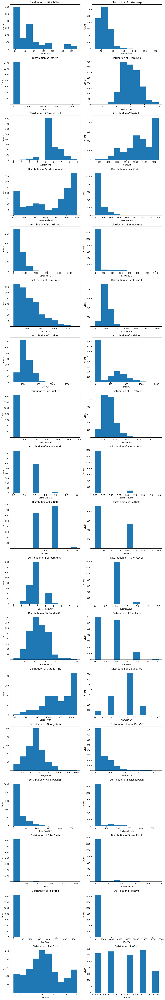

In [13]:
# Define columns to plot (excluding first column)
columns_to_plot = quantitative

# Calculate grid dimensions
n_cols = 2  # Number of columns in the grid
n = len(columns_to_plot)
n_rows = (n + 1) // n_cols  # Number of rows needed

# Create subplots grid with adjusted figure size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
axes = axes.flatten()  # Convert to 1D array for easier handling

# Create plots in grid
for i, col in enumerate(columns_to_plot):
    ax = axes[i]
    if df[col].dtype == 'object':
        # Create bar plot for categorical data
        df[col].value_counts().sort_values(ascending=False).plot(kind='bar', ax=ax)
        ax.set_title(f"Value Counts for {col}")
        ax.set_xlabel('')  # Remove x-axis label
        ax.set_ylabel('')  # Remove y-axis label
    else:
        # Create histogram for numerical data
        df[col].hist(grid=False, ax=ax)
        ax.set_title(f"Distribution of {col}")
        ax.set_xlabel(col)
        ax.set_ylabel("Count")

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()

#### Relationship Between Categorical Columns and SalePrice (y)

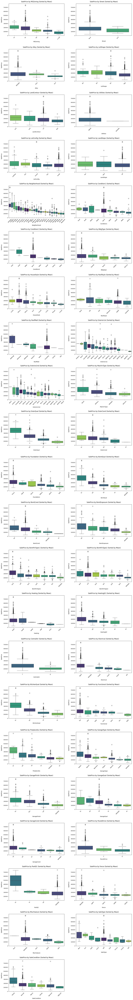

In [14]:
# Define columns to plot (excluding first column)
columns_to_plot = qualitative

# Calculate grid dimensions
n_cols = 2  # Number of columns
n = len(columns_to_plot)
n_rows = (n + 1) // n_cols  # Number of rows needed

# Create subplots grid with adjusted figure size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()  # Convert to 1D array for easier handling

# Create plots in grid
for i, col in enumerate(columns_to_plot):
    ax = axes[i]
    # Calculate means and sort
    means = df.groupby(col)['SalePrice'].mean().sort_values(ascending=False)
    
    # Create boxplot with sorted categories - FIXED WARNING HERE
    sns.boxplot(
        x=col, 
        y='SalePrice', 
        data=df, 
        order=means.index, 
        hue=col,               # Added to resolve warning
        legend=False,          # Added to resolve warning
        palette='viridis',
        ax=ax
    )
    
    ax.set_title(f"SalePrice by {col} (Sorted by Mean)", pad=12)
    ax.set_xlabel(col, labelpad=10)
    ax.set_ylabel("SalePrice", labelpad=10)
    ax.tick_params(axis='x', rotation=45)
    
    # Improve readability of x-axis labels
    ax.xaxis.set_tick_params(labelsize=9)
    ax.yaxis.set_tick_params(labelsize=9)

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display
plt.tight_layout(pad=2.0)
plt.show()

#### ANOVA Test

ANOVA (Analysis of Variance) is used to evaluate how strongly each categorical feature (e.g., "Neighborhood", "HouseStyle") influences the target variable, SalePrice.

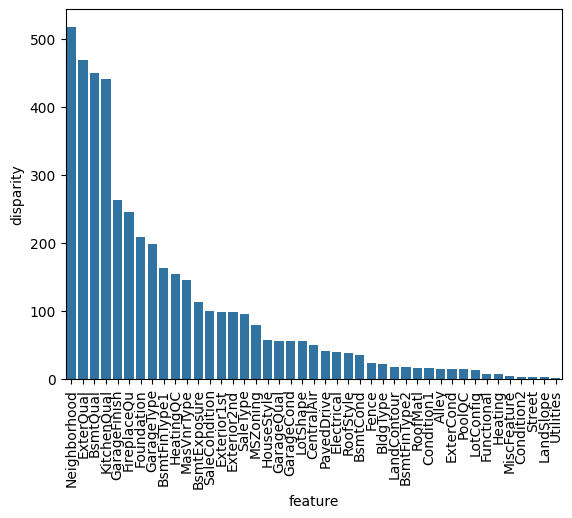

In [15]:


# Create a DataFrame to store the results of the ANOVA test
anv = pd.DataFrame()

# Initialize the DataFrame with a column named 'feature' to store categorical features
anv['feature'] = qualitative

# Initialize an empty list to store the p-values for each feature
pvals = []

# Loop through each categorical feature
for c in qualitative:
    samples = []  # Initialize a list to store the groups of 'SalePrice' for each unique category
    # Loop through each unique category in the current categorical feature
    for cls in df[c].unique():
        # Filter rows where the feature value equals the current category (cls)
        # Extract 'SalePrice' values for this category
        s = df[df[c] == cls]['SalePrice'].values
        samples.append(s)  # Add these values as a group to the samples list
    
    # Perform a one-way ANOVA test on the groups of 'SalePrice' (samples)
    # stats.f_oneway returns the F-statistic and p-value; [1] extracts the p-value
    pval = stats.f_oneway(*samples)[1]
    pvals.append(pval)  # Append the p-value to the list

# Add the calculated p-values to the results DataFrame
anv['pval'] = pvals

# Sort the DataFrame by p-values in ascending order
anv.sort_values('pval', inplace=True)

# Calculate the disparity for visualization: log(1/pval) magnifies significance
anv['disparity'] = np.log(1./anv['pval'].values)

# Create a bar plot using seaborn to visualize feature disparity
sns.barplot(data=anv, x='feature', y='disparity')

# Rotate the x-axis labels by 90 degrees for better readability
x = plt.xticks(rotation=90)


#### Correlations

##### Encode
It’s useful to encode categorical features into numerical representations. The function encode is designed to create an ordinal encoding for a given categorical feature based on the mean Sale Price (SalePrice) of each category. This ensures the encoding reflects the relationship between the feature and the target variable.

In [16]:
def encode(frame, feature):
    ordering = pd.DataFrame()
    ordering['val'] = frame[feature].unique()
    ordering.index = ordering.val
    ordering['spmean'] = frame[[feature, 'SalePrice']].groupby(feature).mean()['SalePrice']
    ordering = ordering.sort_values('spmean')
    ordering['ordering'] = range(1, ordering.shape[0] + 1)
    ordering = ordering['ordering'].to_dict()
    
    for cat, o in ordering.items():
        frame.loc[frame[feature] == cat, feature + '_E'] = o
    
qual_encoded = []
for q in qualitative:  
    encode(df, q)
    qual_encoded.append(q + '_E')

print(qual_encoded)

['MSZoning_E', 'Street_E', 'Alley_E', 'LotShape_E', 'LandContour_E', 'Utilities_E', 'LotConfig_E', 'LandSlope_E', 'Neighborhood_E', 'Condition1_E', 'Condition2_E', 'BldgType_E', 'HouseStyle_E', 'RoofStyle_E', 'RoofMatl_E', 'Exterior1st_E', 'Exterior2nd_E', 'MasVnrType_E', 'ExterQual_E', 'ExterCond_E', 'Foundation_E', 'BsmtQual_E', 'BsmtCond_E', 'BsmtExposure_E', 'BsmtFinType1_E', 'BsmtFinType2_E', 'Heating_E', 'HeatingQC_E', 'CentralAir_E', 'Electrical_E', 'KitchenQual_E', 'Functional_E', 'FireplaceQu_E', 'GarageType_E', 'GarageFinish_E', 'GarageQual_E', 'GarageCond_E', 'PavedDrive_E', 'PoolQC_E', 'Fence_E', 'MiscFeature_E', 'SaleType_E', 'SaleCondition_E']


In [17]:
df[['Neighborhood', 'Neighborhood_E']].head()

,Neighborhood,Neighborhood_E
0,CollgCr,17.0
1,Veenker,21.0
2,CollgCr,17.0
3,Crawfor,18.0
4,NoRidge,25.0


The next code computes the Spearman correlation between each feature and SalePrice and visualizes the results using a horizontal bar plot.

##### Why Spearman Correlation?
Spearman correlation is used in this analysis because:

* Handles Monotonic Relationships: Unlike Pearson correlation, which measures linear relationships, Spearman correlation captures monotonic relationships. This makes it more robust for features that might have a non-linear but consistent ranking association with SalePrice.
* Works with Ordinal Data: Some features, especially the encoded categorical variables (qual_encoded), are ordinal in nature. Spearman correlation is well-suited for such data since it is based on rank-order rather than raw values.
* Less Sensitive to Outliers: By relying on ranks, Spearman correlation is less affected by extreme values or outliers, which are common in real-world datasets like house prices.

<Axes: xlabel='spearman', ylabel='feature'>

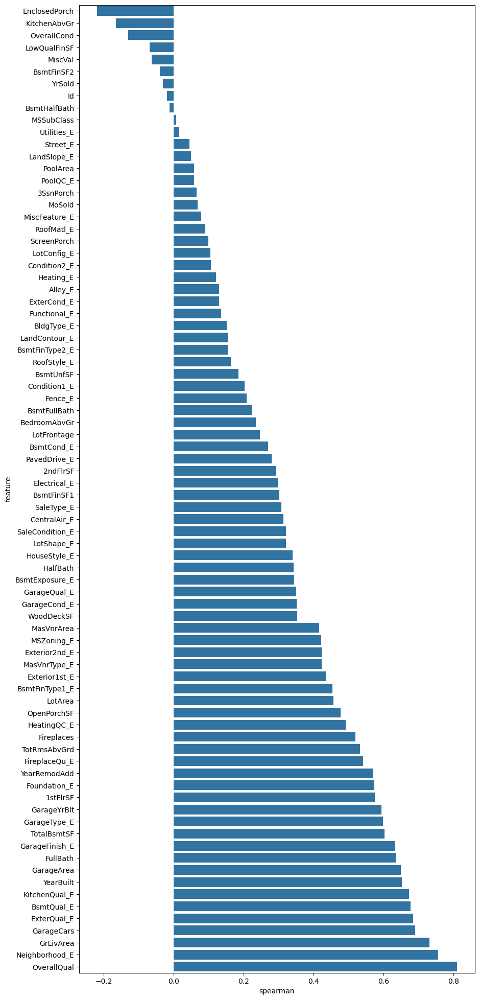

In [18]:
spr = pd.DataFrame()
features = df.select_dtypes(exclude='object').columns.tolist() + qual_encoded
features = [feature for feature in features if feature != 'SalePrice']
spr['feature'] = features
spr['spearman'] = [df[f].corr(df['SalePrice'], 'spearman') for f in features]
spr = spr.sort_values('spearman')
plt.figure(figsize=(10, 0.20*len(features)))
sns.barplot(data=spr, y='feature', x='spearman', orient='h')

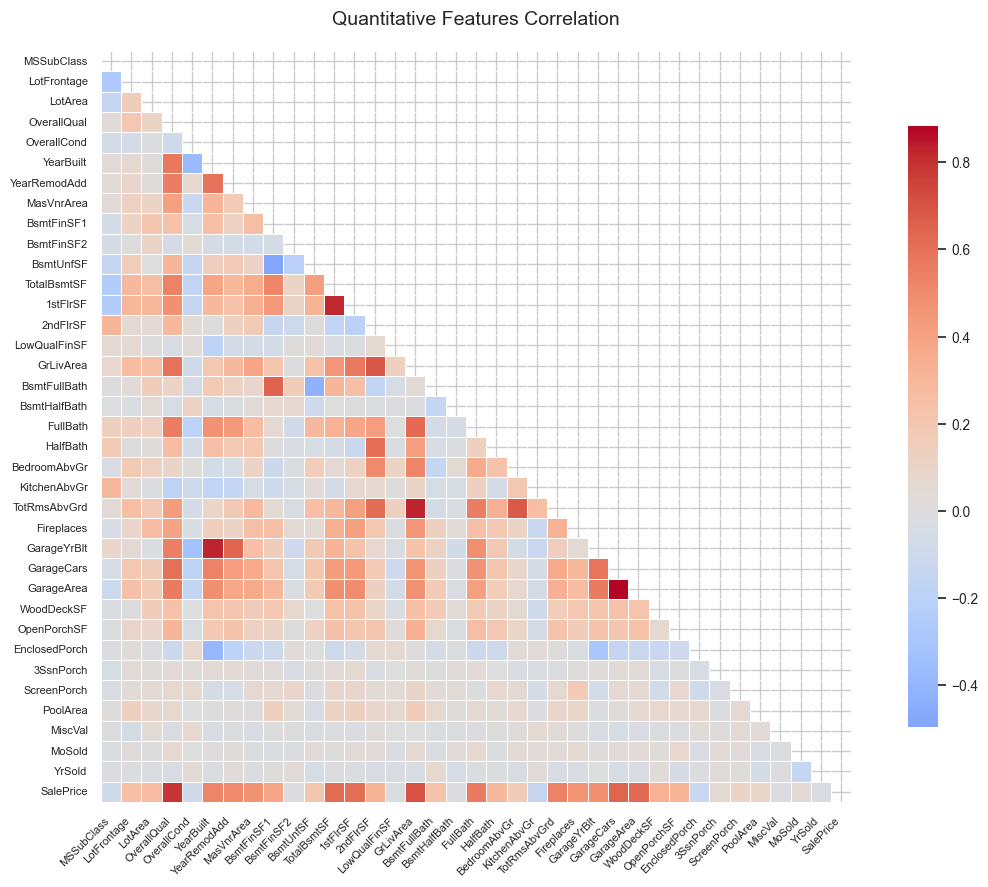

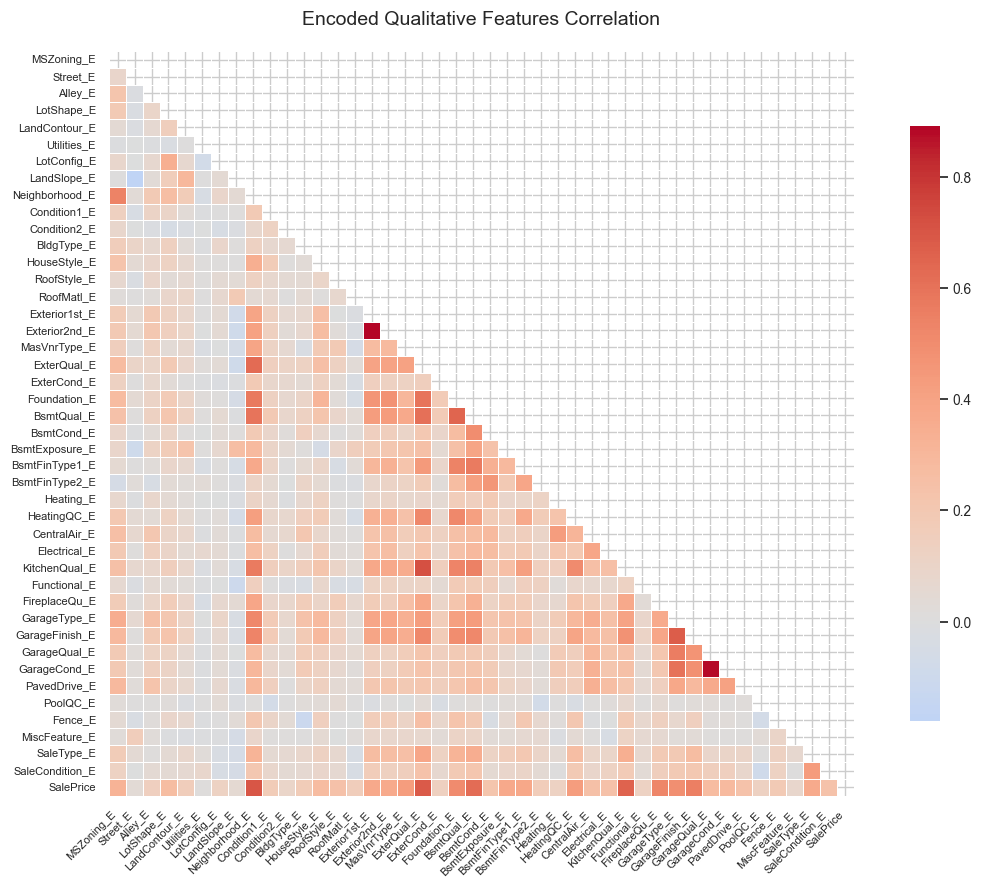

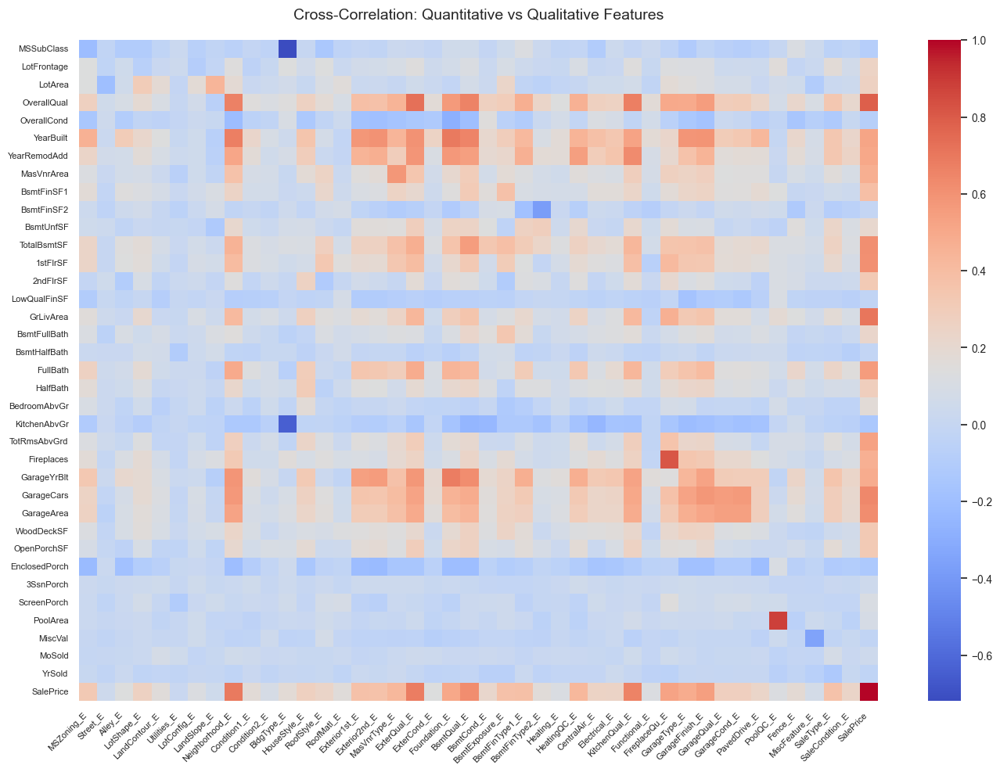

In [19]:
# Set style for better aesthetics
sns.set_theme(context="notebook", style="whitegrid", font_scale=0.9)

# Define helper function to plot heatmaps
def plot_corr_heatmap(data, columns, title, figsize=(12, 9)):
    plt.figure(figsize=figsize)
    corr = data[columns].corr()
    mask = None
    # Optional: Mask upper triangle for square matrices
    if len(columns) == len(corr.columns):
        mask = np.triu(np.ones_like(corr, dtype=bool))
    sns.heatmap(
        corr,
        cmap='coolwarm',
        annot=False,  # Set to True if you want values
        fmt=".2f",
        center=0,
        square=True,
        mask=mask,
        cbar_kws={'shrink': 0.8},
        linewidths=0.5
    )
    plt.title(title, fontsize=14, pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.tight_layout()

# Plot quantitative features + SalePrice
plot_corr_heatmap(
    df,
    quantitative + ['SalePrice'],
    "Quantitative Features Correlation"
)

# Plot encoded qualitative features + SalePrice
plot_corr_heatmap(
    df,
    qual_encoded + ['SalePrice'],
    "Encoded Qualitative Features Correlation"
)

# Cross-correlation between quantitative and qualitative features
plt.figure(figsize=(14, 10))
corr = pd.DataFrame(np.zeros([len(quantitative)+1, len(qual_encoded)+1]), index=quantitative+['SalePrice'], columns=qual_encoded+['SalePrice'])
for q1 in quantitative+['SalePrice']:
    for q2 in qual_encoded+['SalePrice']:
        corr.loc[q1, q2] = df[q1].corr(df[q2])
sns.heatmap( 
    corr,
    cmap='coolwarm',
)
plt.title("Cross-Correlation: Quantitative vs Qualitative Features", fontsize=14, pad=20)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()

plt.show()

##### Variance Inflation Factor (VIF)

Variance Inflation Factor (VIF) is a measure used to detect multicollinearity in a dataset, particularly among the independent (predictor) variables. Multicollinearity occurs when two or more predictors are highly correlated, meaning they provide redundant or overlapping information.

In simple terms, VIF quantifies how much the variance of a feature’s coefficient in a regression model is inflated due to multicollinearity with other features.

In [20]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for numerical features
columns = quantitative + qual_encoded
columns = [feature for feature in columns if feature not in ['GarageYrBlt', "SalePrice"]] # Exclude GarageYrBlt by 
X = df[columns]
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data)


c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


            feature         VIF
0        MSSubClass   12.501654
1       LotFrontage    7.763222
2           LotArea    3.635904
3       OverallQual   86.581548
4       OverallCond   51.637767
..              ...         ...
73         PoolQC_E  273.447353
74          Fence_E   35.508574
75    MiscFeature_E  137.309630
76       SaleType_E   32.790509
77  SaleCondition_E   41.748007

[78 rows x 2 columns]


In [21]:
# Sort VIF data for better visualization
vif_data = vif_data.sort_values(by="VIF", ascending=False)


In [22]:
vif_data.head(100)

,feature,VIF
13,2ndFlrSF,inf
12,1stFlrSF,inf
10,BsmtUnfSF,inf
11,TotalBsmtSF,inf
8,BsmtFinSF1,inf
...,...,...
28,EnclosedPorch,1.510136
17,BsmtHalfBath,1.297274
30,ScreenPorch,1.234274
32,MiscVal,1.222190


C:\Users\david\AppData\Local\Temp\ipykernel_25344\87166190.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=vif_data[vif_data["VIF"] <1000], x="VIF", y="feature", palette="viridis")


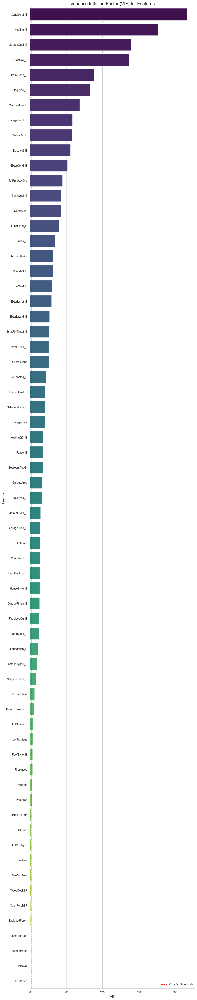

In [23]:
# Plot VIF values
plt.figure(figsize=(10, 50))
sns.barplot(data=vif_data[vif_data["VIF"] <1000], x="VIF", y="feature", palette="viridis")
plt.title("Variance Inflation Factor (VIF) for Features", fontsize=16)
plt.xlabel("VIF", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.axvline(x=5, color='red', linestyle='--', label="VIF = 5 (Threshold)")
plt.legend()
plt.tight_layout()
plt.show()

#### Pairplots
Sale price compares to each independent variable

In [24]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,GarageType_E,GarageFinish_E,GarageQual_E,GarageCond_E,PavedDrive_E,PoolQC_E,Fence_E,MiscFeature_E,SaleType_E,SaleCondition_E
0,1,60,RL,65.0,8450,Pave,MISSING,Reg,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
1,2,20,RL,80.0,9600,Pave,MISSING,Reg,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
2,3,60,RL,68.0,11250,Pave,MISSING,IR1,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0
3,4,70,RL,60.0,9550,Pave,MISSING,IR1,Lvl,AllPub,...,3.0,2.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,2.0
4,5,60,RL,84.0,14260,Pave,MISSING,IR1,Lvl,AllPub,...,6.0,3.0,4.0,6.0,3.0,1.0,5.0,4.0,5.0,5.0


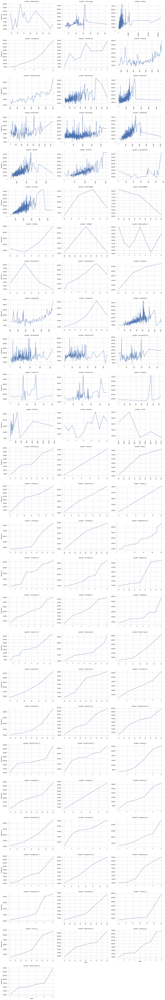

In [25]:
def pairplot(x, y, **kwargs):
    ax = plt.gca()
    ts = pd.DataFrame({'time': x, 'val': y})
    ts = ts.groupby('time').mean()
    ts.plot(ax=ax)
    plt.xticks(rotation=90)
    
f = pd.melt(df, id_vars=['SalePrice'], value_vars=quantitative+qual_encoded)
g = sns.FacetGrid(f, col="variable", col_wrap=3, sharex=False, sharey=False, height=4, aspect=1.5)  # Increase col_wrap for a wider layout
g = g.map(pairplot, "value", "SalePrice")

#### Distribution Fitting and Linearity Evaluation
The idea aim to both understand the underlying distributions of the features and evaluate how different transformations impact the relationship between these features and the target variable (SalePrice). This is critical for ensuring that the data is well-prepared for linear modeling.

c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:6626: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2036: RuntimeWarning: overflow encountered in divide
  place(output, cond, self._pdf(*goodargs) / scale)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:6626: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\numpy\_core\f

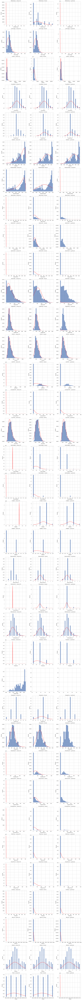

In [26]:
# Set the figure size
fig, axes = plt.subplots(nrows=len(quantitative), ncols=3, figsize=(15, 5 * len(quantitative)))

# Loop through features and plot each distribution in three columns
for i, feature in enumerate(quantitative):
    try:
        # Johnson SU
        sns.histplot(df[feature], kde=False, stat="density", bins=30, ax=axes[i, 0])
        x = np.linspace(df[feature].min(), df[feature].max(), 100)
        axes[i, 0].plot(x, stats.johnsonsu.pdf(x, *stats.johnsonsu.fit(df[feature])), color="red")
        axes[i, 0].set_title(f"{feature} - Johnson SU")

        # Normal Distribution
        sns.histplot(df[feature], kde=False, stat="density", bins=30, ax=axes[i, 1])
        x = np.linspace(df[feature].min(), df[feature].max(), 100)
        axes[i, 1].plot(x, stats.norm.pdf(x, *stats.norm.fit(df[feature])), color="red")
        axes[i, 1].set_title(f"{feature} - Normal")

        # Log-Normal Distribution
        sns.histplot(df[feature], kde=False, stat="density", bins=30, ax=axes[i, 2])
        x = np.linspace(df[feature].min(), df[feature].max(), 100)
        axes[i, 2].plot(x, stats.lognorm.pdf(x, *stats.lognorm.fit(df[feature])), color="red")
        axes[i, 2].set_title(f"{feature} - Log Normal")

    except:
        pass

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# ---------------------------------------------------
# 1. Define candidate distributions with constraints
# ---------------------------------------------------
DISTRIBUTIONS = [
    {
        "dist": stats.norm,
        "name": "Normal",
        "constraint": lambda data: True  # Always applicable
    },
    {
        "dist": stats.johnsonsu,
        "name": "Johnson SU",
        "constraint": lambda data: True
    },
    {
        "dist": stats.lognorm,
        "name": "Log-Normal",
        "constraint": lambda data: (data > 0).all()
    },
    {
        "dist": stats.expon,
        "name": "Exponential",
        "constraint": lambda data: (data >= 0).all()
    },
    {
        "dist": stats.weibull_min,
        "name": "Weibull",
        "constraint": lambda data: (data > 0).all()
    },
    # You can add more distributions if needed.
]

def best_fitting_distribution(data):
    """
    Fit each candidate distribution to data and return the one with the lowest AIC.
    If none fit, fallback to a Normal distribution.
    """
    best_dist = None
    best_aic = np.inf

    for candidate in DISTRIBUTIONS:
        if not candidate["constraint"](data):
            continue
        try:
            params = candidate["dist"].fit(data)
            log_likelihood = np.sum(candidate["dist"].logpdf(data, *params))
            k = len(params)
            aic = 2 * k - 2 * log_likelihood
            if aic < best_aic:
                best_aic = aic
                best_dist = {**candidate, "params": params}
        except Exception:
            continue

    if best_dist is None:
        best_dist = {
            "dist": stats.norm,
            "name": "Normal",
            "params": stats.norm.fit(data)
        }
    return best_dist

# ---------------------------------------------------
# 2. Transform each feature using its best-fitting distribution
# ---------------------------------------------------
# Assume 'quantitative' and 'qual_encoded' are your lists of feature names.
transformation_dict = {}  # Record which transformation is used for each feature

for feature in quantitative + qual_encoded:
    data = df[feature].dropna()
    best_fit = best_fitting_distribution(data)
    transformation_dict[feature] = best_fit["name"]
    # Create a new column for the transformed feature using the fitted CDF.
    df[f"{feature}_transformed"] = best_fit["dist"].cdf(df[feature], *best_fit["params"])

# ---------------------------------------------------
# 3. Also transform SalePrice using its best-fitting distribution
# ---------------------------------------------------
saleprice_data = df['SalePrice'].dropna()
best_fit_saleprice = best_fitting_distribution(saleprice_data)
saleprice_transformation = best_fit_saleprice["name"]
df["SalePrice_transformed"] = best_fit_saleprice["dist"].cdf(df["SalePrice"], *best_fit_saleprice["params"])

# ---------------------------------------------------
# 4. Create a grid of subplots: one row per feature, four columns:
#     Column 1: Raw feature vs. Raw SalePrice
#     Column 2: Transformed feature vs. Raw SalePrice
#     Column 3: Transformed feature vs. Transformed SalePrice
#     Column 4: Raw feature vs. Transformed SalePrice
# ---------------------------------------------------
n_features = len(quantitative + qual_encoded)
fig, axes = plt.subplots(n_features, 4, figsize=(24, 4 * n_features), squeeze=False)

for i, feature in enumerate(quantitative + qual_encoded):
    # ----------------------------
    # Column 1: Raw Feature vs. Raw SalePrice
    # ----------------------------
    ax1 = axes[i, 0]
    data_raw = df[[feature, 'SalePrice']].dropna()
    # Group by the raw feature values and compute the mean SalePrice
    temp_raw = data_raw.groupby(feature)['SalePrice'].mean().reset_index()
    ax1.plot(temp_raw[feature], temp_raw['SalePrice'], marker='o', linestyle='-')
    ax1.set_title(f"{feature} (Raw) vs. SalePrice (Raw)")
    ax1.set_xlabel(feature)
    ax1.set_ylabel("SalePrice (Raw)")
    
    # ----------------------------
    # Column 2: Transformed Feature vs. Raw SalePrice
    # ----------------------------
    ax2 = axes[i, 1]
    trans_feature = f"{feature}_transformed"
    data_trans_feature = df[[trans_feature, 'SalePrice']].dropna()
    temp_trans_feature = data_trans_feature.groupby(trans_feature)['SalePrice'].mean().reset_index()
    ax2.plot(temp_trans_feature[trans_feature], temp_trans_feature['SalePrice'], marker='o', linestyle='-')
    ax2.set_title(f"{feature} (Transformed: {transformation_dict[feature]}) vs. SalePrice (Raw)")
    ax2.set_xlabel("Transformed Value")
    ax2.set_ylabel("SalePrice (Raw)")
    
    # ----------------------------
    # Column 3: Transformed Feature vs. Transformed SalePrice
    # ----------------------------
    ax3 = axes[i, 2]
    data_trans_both = df[[trans_feature, 'SalePrice_transformed']].dropna()
    temp_trans_both = data_trans_both.groupby(trans_feature)['SalePrice_transformed'].mean().reset_index()
    ax3.plot(temp_trans_both[trans_feature], temp_trans_both['SalePrice_transformed'], marker='o', linestyle='-')
    ax3.set_title(f"{feature} (Transformed: {transformation_dict[feature]}) vs. SalePrice (Transformed: {saleprice_transformation})")
    ax3.set_xlabel("Transformed Value")
    ax3.set_ylabel("SalePrice (Transformed)")
    
    # ----------------------------
    # Column 4: Raw Feature vs. Transformed SalePrice
    # ----------------------------
    ax4 = axes[i, 3]
    data_raw_transSP = df[[feature, 'SalePrice_transformed']].dropna()
    temp_raw_transSP = data_raw_transSP.groupby(feature)['SalePrice_transformed'].mean().reset_index()
    ax4.plot(temp_raw_transSP[feature], temp_raw_transSP['SalePrice_transformed'], marker='o', linestyle='-')
    ax4.set_title(f"{feature} (Raw) vs. SalePrice (Transformed: {saleprice_transformation})")
    ax4.set_xlabel(feature)
    ax4.set_ylabel("SalePrice (Transformed)")

plt.tight_layout()
plt.show()


C:\Users\david\AppData\Local\Temp\ipykernel_25344\2583226125.py:79: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{feature}_transformed"] = best_fit["dist"].cdf(df[feature], *best_fit["params"])
C:\Users\david\AppData\Local\Temp\ipykernel_25344\2583226125.py:79: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{feature}_transformed"] = best_fit["dist"].cdf(df[feature], *best_fit["params"])
C:\Users\david\AppData\Local\Temp\ipykernel_25344\2583226125.py:79: PerformanceWarning: DataFrame is highly fragmented.  This is usual

---
### **4. Prepare the data for machine learning algorithms.**

In [28]:
# read the dataframe again to make the procedure clearer
df = pd.read_csv("../data/house_price_project/train.csv")
df_test = pd.read_csv("../data/house_price_project/test.csv")

In [29]:

# Steps

# Organizate repo add readme

# Make clean
# Make pipeline
    # categorical atributtes
    # trasnform features (choose which transform based on correlation & relation with sale price) delete feautres if neccesary
    # trasnform Y (sle price)
# Split in trainig and test